### Importación de datos



In [86]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import os

# Crear carpeta 'imagenes' si no existe
os.makedirs("imagenes", exist_ok=True)

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


#1. Análisis de facturación



In [87]:
#Extraccion de datos

total_de_ventas = tienda['Precio'].sum()
total_de_ventas2 = tienda2['Precio'].sum()
total_de_ventas3 = tienda3['Precio'].sum()
total_de_ventas4 = tienda4['Precio'].sum()

print(f'El total vendido en la tienda 1 es de: {total_de_ventas}')
print(f'El total vendido en la tienda 2 es de: {total_de_ventas2}')
print(f'El total vendido en la tienda 3 es de: {total_de_ventas3}')
print(f'El total vendido en la tienda 4 es de: {total_de_ventas4}')

ventas = [total_de_ventas, total_de_ventas2, total_de_ventas3, total_de_ventas4]
mayor_facturacion = max(ventas)
menor_facturacion = min(ventas)

if mayor_facturacion == total_de_ventas:
  print('\nLa mayor facturación es de la tienda 1')
elif mayor_facturacion == total_de_ventas2:
  print('\nLa mayor facturación es de la tienda 2')
elif mayor_facturacion == total_de_ventas3:
  print('\nLa mayor facturación es de la tienda 3')
elif mayor_facturacion == total_de_ventas4:
  print('\nLa mayor facturación es de la tienda 4')

if menor_facturacion == total_de_ventas:
  print('\nLa menor facturación es de la tienda 1')
elif menor_facturacion == total_de_ventas2:
  print('\nLa menor facturación es de la tienda 2')
elif menor_facturacion == total_de_ventas3:
  print('\nLa menor facturación es de la tienda 3')
elif menor_facturacion == total_de_ventas4:
  print('\nLa menor facturación es de la tienda 4')


El total vendido en la tienda 1 es de: 1150880400.0
El total vendido en la tienda 2 es de: 1116343500.0
El total vendido en la tienda 3 es de: 1098019600.0
El total vendido en la tienda 4 es de: 1038375700.0

La mayor facturación es de la tienda 1

La menor facturación es de la tienda 4


<ipython-input-88-17ddd2144b36>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nombres, y=ventas_totales, palette="Set2")


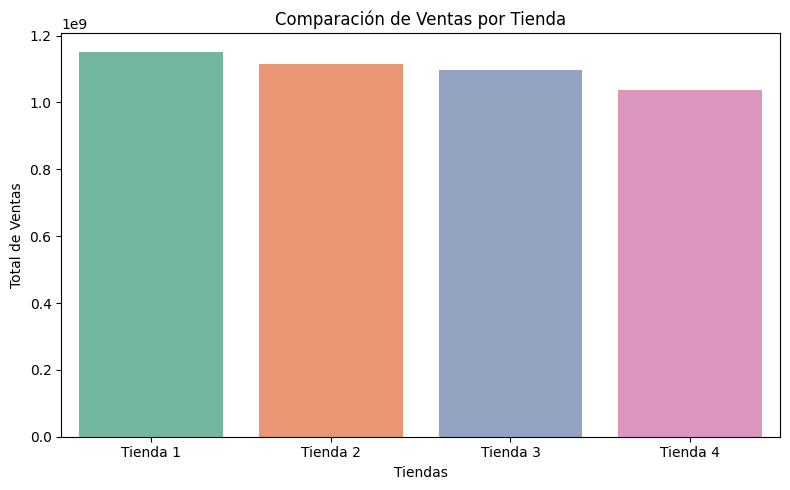

In [88]:
#Graficos


nombres_tiendas = ["Tienda 1", "Tienda 2", "Tienda 3", "Tienda 4"]

# Crear la gráfica
plt.figure(figsize=(8, 5))
plt.bar(nombres_tiendas, ventas, color="skyblue")

plt.title("Comparación de Ventas por Tienda")
sns.barplot(x=nombres, y=ventas_totales, palette="Set2")
plt.xlabel("Tiendas")
plt.ylabel("Total de Ventas")
plt.tight_layout()
plt.savefig("imagenes/grafico_ventas_por_tienda.jpg", dpi=300, bbox_inches='tight')
plt.show()

# 2. Ventas por categoría

In [89]:
for i, (df, nombre) in enumerate(zip(tiendas, nombres)):
    fila = i // 2
    columna = i % 2

    ventas = df.groupby('Categoría del Producto')['Precio'].sum().reset_index().sort_values(by='Precio', ascending=False)
    print(f'\nFacturacion por categoria de la tienda: \n{ventas}')

for i, (df, nombre) in enumerate(zip(tiendas, nombres)):
    fila = i // 2
    columna = i % 2

    cantidad = df.groupby('Categoría del Producto').size().reset_index(name='Cantidad de Ventas').sort_values(by='Cantidad de Ventas', ascending=False)
    print(f'\nLas cantidad de ventas por categoria de la tienda: \n{cantidad}')


Facturacion por categoria de la tienda: 
    Categoría del Producto       Precio
3             Electrónicos  429493500.0
2        Electrodomésticos  363685200.0
7                  Muebles  187633700.0
4   Instrumentos musicales   91299000.0
1     Deportes y diversión   39290000.0
5                 Juguetes   17995700.0
0  Artículos para el hogar   12698400.0
6                   Libros    8784900.0

Facturacion por categoria de la tienda: 
    Categoría del Producto       Precio
3             Electrónicos  410831100.0
2        Electrodomésticos  348567800.0
7                  Muebles  176426300.0
4   Instrumentos musicales  104990300.0
1     Deportes y diversión   34744500.0
5                 Juguetes   15945400.0
0  Artículos para el hogar   14746900.0
6                   Libros   10091200.0

Facturacion por categoria de la tienda: 
    Categoría del Producto       Precio
3             Electrónicos  410775800.0
2        Electrodomésticos  329237900.0
7                  Muebles  201072

<ipython-input-98-3c470447e8d6>:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[fila, columna].set_xticklabels(cantidad['Categoría del Producto'], rotation=45, ha='right')
<ipython-input-98-3c470447e8d6>:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[fila, columna].set_xticklabels(cantidad['Categoría del Producto'], rotation=45, ha='right')
<ipython-input-98-3c470447e8d6>:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[fila, columna].set_xticklabels(cantidad['Categoría del Producto'], rotation=45, ha='right')
<ipython-input-98-3c470447e8d6>:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[fila, columna].set_xticklabels(cantidad['Cat

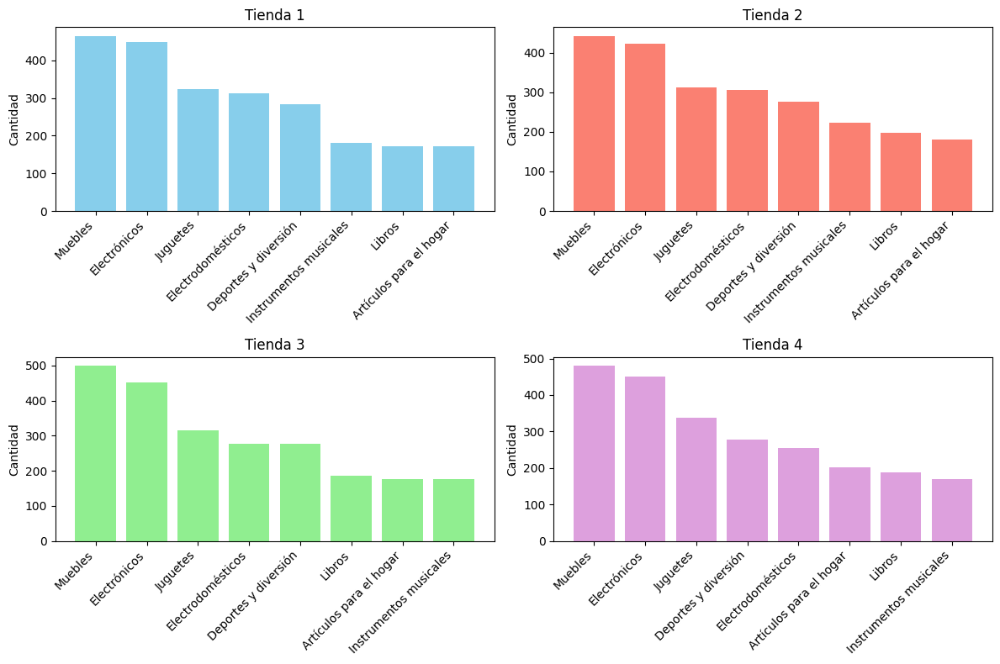

In [98]:


# Crear figura y ejes en una cuadrícula 2x2
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Lista de tiendas y nombres
tiendas = [tienda, tienda2, tienda3, tienda4]
nombres = ["Tienda 1", "Tienda 2", "Tienda 3", "Tienda 4"]
colores = ["skyblue", "salmon", "lightgreen", "plum"]  # Colores distintos para cada gráfica

# Recorrer las tiendas y graficar en su subplot correspondiente
for i, (df, nombre) in enumerate(zip(tiendas, nombres)):
    fila = i // 2
    columna = i % 2

    cantidad = df.groupby('Categoría del Producto').size().reset_index(name='Cantidad de Ventas').sort_values(by='Cantidad de Ventas', ascending=False)

    axs[fila, columna].bar(cantidad['Categoría del Producto'], cantidad['Cantidad de Ventas'], color=colores[i])
    axs[fila, columna].set_title(nombre)
    axs[fila, columna].set_xticklabels(cantidad['Categoría del Producto'], rotation=45, ha='right')
    axs[fila, columna].set_ylabel('Cantidad')

# Ajustar espacio para que no se encimen
plt.tight_layout()
plt.savefig("imagenes/Ventas por categoria.png", dpi=300, bbox_inches='tight')
plt.show()


# 3. Calificación promedio de la tienda


In [91]:
for i, (df, nombre) in enumerate(zip(tiendas, nombres)):
    fila = i // 2
    columna = i % 2

    calif = round(df['Calificación'].sum() / len(df), 2)
    print(f'\nCalificacion de la tienda: \n{calif}')


Calificacion de la tienda: 
3.98

Calificacion de la tienda: 
4.04

Calificacion de la tienda: 
4.05

Calificacion de la tienda: 
4.0


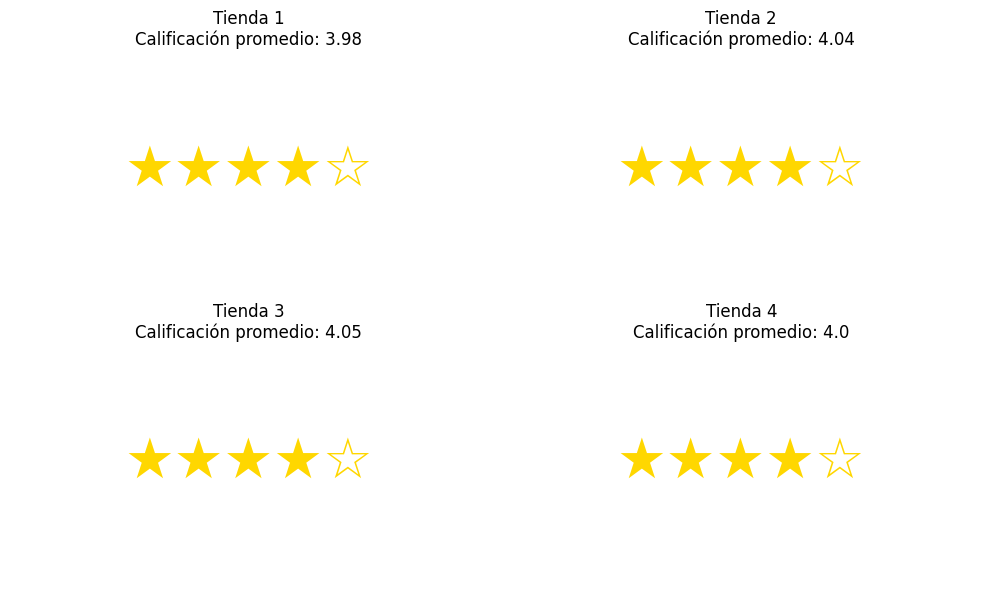

In [99]:

# Crear figura y subplots
fig, axs = plt.subplots(2, 2, figsize=(10, 6))

for i, (df, nombre) in enumerate(zip(tiendas, nombres)):
    fila = i // 2
    columna = i % 2

    # Calificación promedio
    calif = round(df['Calificación'].mean(), 2)

    # Reglas personalizadas para mostrar estrellas
    if calif >= 4.75:
        estrellas_llenas = 5
        media_estrella = 0
    elif calif >= 4.25:
        estrellas_llenas = 4
        media_estrella = 1
    elif calif >= 3.75:
        estrellas_llenas = 4
        media_estrella = 0
    elif calif >= 3.25:
        estrellas_llenas = 3
        media_estrella = 1
    else:
        estrellas_llenas = int(calif)
        media_estrella = 1 if (calif - estrellas_llenas) >= 0.5 else 0

    estrellas_vacias = 5 - estrellas_llenas - media_estrella

    # Crear string de estrellas
    texto_estrellas = '★' * estrellas_llenas + '⯨' * media_estrella + '☆' * estrellas_vacias

    # Mostrar gráfico
    axs[fila, columna].text(0.5, 0.5, texto_estrellas, fontsize=40, ha='center', va='center', color='gold')
    axs[fila, columna].set_title(f'{nombre}\nCalificación promedio: {calif}', fontsize=12)
    axs[fila, columna].axis('off')

plt.tight_layout()
plt.savefig("imagenes/grafico_estrellas_calificacion.png")
plt.show()

# 4. Productos más y menos vendidos

In [93]:
for i, (df, nombre) in enumerate(zip(tiendas, nombres)):
    fila = i // 2
    columna = i % 2

    cantidad_producto = df.groupby('Producto').size().reset_index(name='Cantidad de Ventas').sort_values(by='Cantidad de Ventas', ascending=False)
    print(f'\nLas cantidad de ventas por producto de la tienda: \n\n{cantidad_producto}')


Las cantidad de ventas por producto de la tienda: 

                       Producto  Cantidad de Ventas
1                       Armario                  60
48                TV LED UHD 4K                  60
33                   Microondas                  60
40             Secadora de ropa                  58
32                Mesa de noche                  56
9       Bloques de construcción                  56
5           Balón de baloncesto                  55
8                     Bicicleta                  54
23                    Impresora                  54
50                 Vaso térmico                  54
39                 Refrigerador                  54
7                       Batería                  53
15                   Cubertería                  52
12    Carrito de control remoto                  52
35          Modelado predictivo                  51
3                   Auriculares                  50
0             Ajedrez de madera                  49
25         

<ipython-input-102-e292eb95cfac>:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[fila, columna].set_xticklabels(cantidad_producto['Cantidad de Ventas'], rotation=45, ha='right')
<ipython-input-102-e292eb95cfac>:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[fila, columna].set_xticklabels(cantidad_producto['Cantidad de Ventas'], rotation=45, ha='right')
<ipython-input-102-e292eb95cfac>:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[fila, columna].set_xticklabels(cantidad_producto['Cantidad de Ventas'], rotation=45, ha='right')
<ipython-input-102-e292eb95cfac>:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[fila, columna].set_xtickl

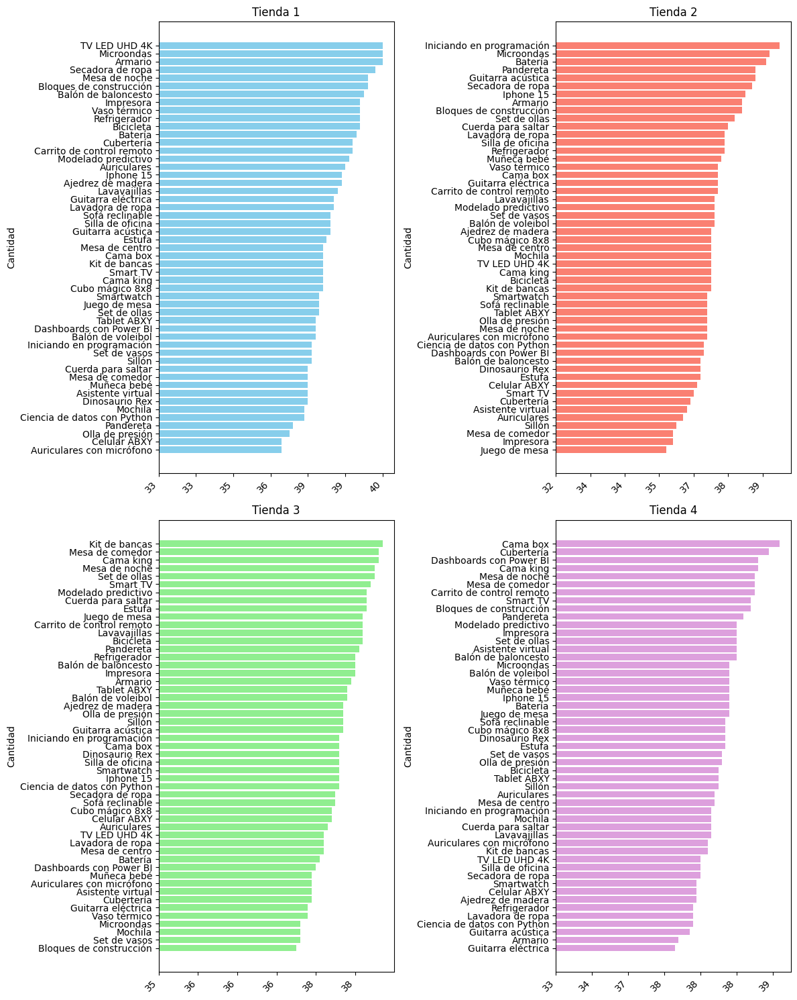

In [102]:


# Crear figura y ejes en una cuadrícula 2x2
fig, axs = plt.subplots(2, 2, figsize=(12, 15))

# Lista de tiendas y nombres
tiendas = [tienda, tienda2, tienda3, tienda4]
nombres = ["Tienda 1", "Tienda 2", "Tienda 3", "Tienda 4"]
colores = ["skyblue", "salmon", "lightgreen", "plum"]  # Colores distintos para cada gráfica

# Recorrer las tiendas y graficar en su subplot correspondiente
for i, (df, nombre) in enumerate(zip(tiendas, nombres)):
    fila = i // 2
    columna = i % 2

    cantidad_producto = df.groupby('Producto').size().reset_index(name='Cantidad de Ventas').sort_values(by='Cantidad de Ventas', ascending=True)

    axs[fila, columna].barh(cantidad_producto['Producto'], cantidad_producto['Cantidad de Ventas'], color=colores[i])
    axs[fila, columna].set_title(nombre)
    axs[fila, columna].set_xticklabels(cantidad_producto['Cantidad de Ventas'], rotation=45, ha='right')
    axs[fila, columna].set_ylabel('Cantidad')

# Ajustar espacio para que no se encimen
plt.tight_layout()
plt.savefig("imagenes/productos mas vendidos.png", dpi=300, bbox_inches='tight')
plt.show()


# 5. Envío promedio por tienda

In [95]:
for i, (df, nombre) in enumerate(zip(tiendas, nombres)):
    fila = i // 2
    columna = i % 2

    costo_envio = df['Costo de envío'].sum()
    print(f'\nCosto de envío de la tienda: \n{costo_envio}')


Costo de envío de la tienda: 
61377900.0

Costo de envío de la tienda: 
59485100.0

Costo de envío de la tienda: 
58516600.0

Costo de envío de la tienda: 
55317400.0


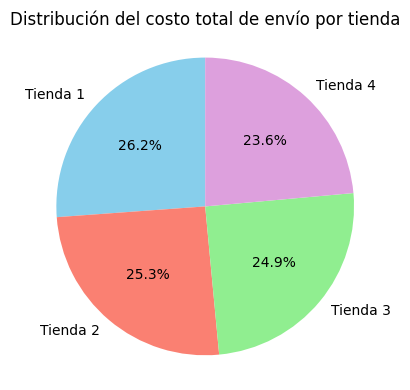

In [103]:
# Sumar el total del costo de envío por tienda
costos_envio = [tienda['Costo de envío'].sum(),
                tienda2['Costo de envío'].sum(),
                tienda3['Costo de envío'].sum(),
                tienda4['Costo de envío'].sum()]

# Etiquetas para cada tienda
nombres = ["Tienda 1", "Tienda 2", "Tienda 3", "Tienda 4"]

# Crear gráfica circular
plt.figure(figsize=(4, 4))
plt.pie(
    costos_envio,
    labels=nombres,
    autopct='%1.1f%%',
    startangle=90,
    colors=['skyblue', 'salmon', 'lightgreen', 'plum']
)

plt.title('Distribución del costo total de envío por tienda')
plt.axis('equal')
plt.tight_layout()
plt.savefig("imagenes/costos de envio.png", dpi=300, bbox_inches='tight')
plt.show()

# 6. Desempeño geográfico.

In [97]:
import folium
from folium.plugins import MarkerCluster



# Crear mapa
mapa = folium.Map(location=[4.570868, -74.297333], zoom_start=6)

# Datos
tiendas = [tienda, tienda2, tienda3, tienda4]
nombres = ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4']
colores = ['red', 'blue', 'green', 'purple']

# Crear capas
for df, nombre, color in zip(tiendas, nombres, colores):
    capa = folium.FeatureGroup(name=nombre)
    cluster = MarkerCluster(name=f"Cluster {nombre}").add_to(capa)

    df_limpia = df.dropna(subset=['lat', 'lon'])

    for _, fila in df_limpia.iterrows():
        folium.CircleMarker(
            location=[fila['lat'], fila['lon']],
            radius=5,
            color=color,
            fill=True,
            fill_opacity=0.7,
            popup=f"{nombre} - {fila.get('Producto', '')}"
        ).add_to(cluster)

    capa.add_to(mapa)

# Agregar control de capas
folium.LayerControl().add_to(mapa)

# Guardar mapa
mapa.save("mapa_tiendas.html")
mapa

# Informe de Análisis de Ventas en 4 Tiendas

## 1. Introducción
En este análisis se estudian los datos de ventas provenientes de cuatro tiendas ubicadas en diferentes regiones de Latinoamérica. El propósito principal es identificar cuál de las tiendas tiene el mejor rendimiento en términos de ventas, qué productos y categorías son los más vendidos, y cómo se distribuyen geográficamente las ventas. A partir de estos hallazgos, se brindará una recomendación estratégica sobre cuál tienda se dedberia vender para enfocar inversiones en mejores o diferenes negocios.

##2. Resultados del análisis.

**La recomendación es vender la tienda número 4.**

Al revisar la facturación por tienda se puede observar en la gráfica que la tienda que menos ingresos registra es la tienda número 4


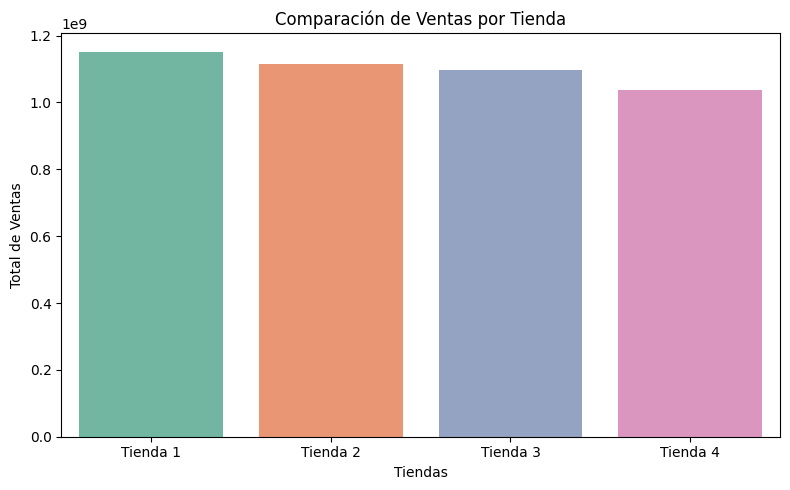

Se puede observar que las dos categorias más vendidas son iguales en todas las tiendas.

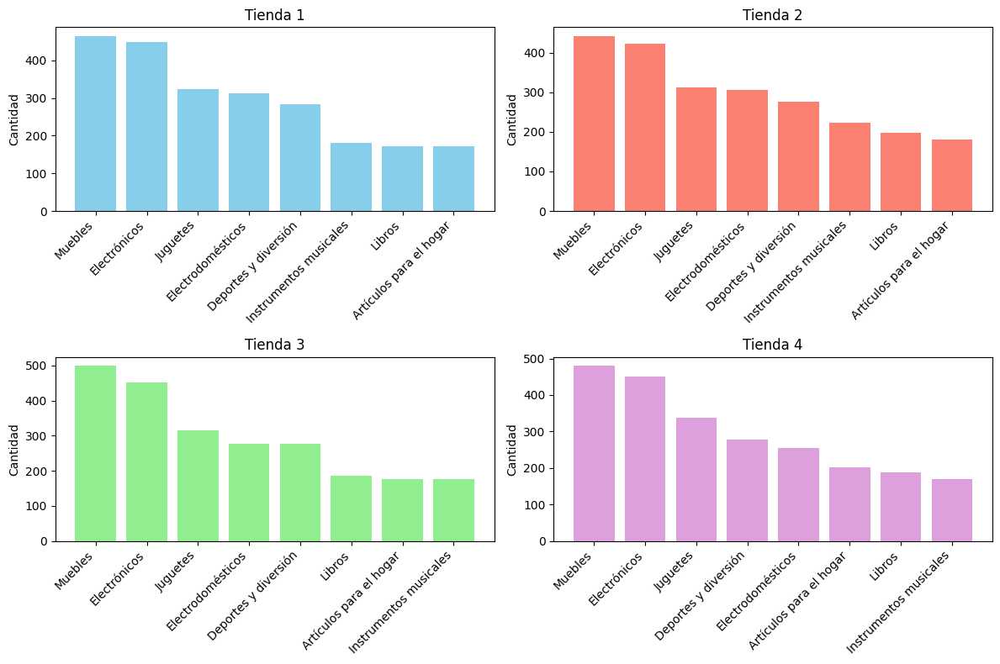

También se puede observar que la **Tienda 4** es la segunda tienda con menor calificación

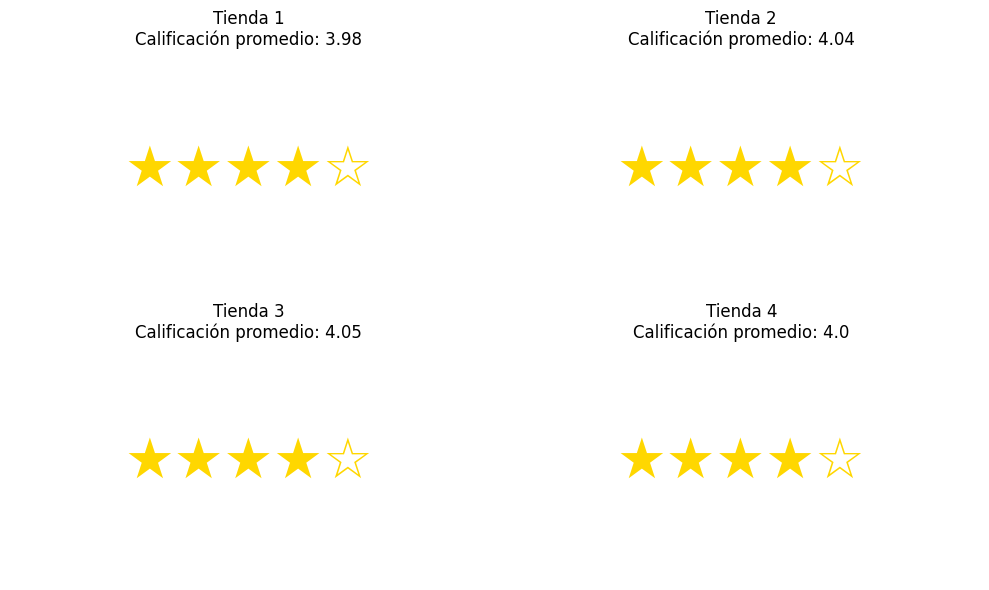

Si bien tiene a favor que es la tienda que menos gasta en realizar envios tambien se le puede adjudicar a que es la tienda que menos factura de las 4

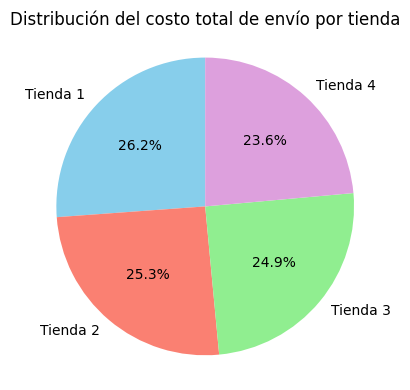

## 5. Conclusiones
Tras analizar las ventas totales, la cantidad de productos vendidos y la distribución por categorías, se puede concluir que:

- La tienda con mayores ventas totales fue la **Tienda 2**, lo cual sugiere un mayor rendimiento en términos de ingresos.
- La tienda con menores ventas totales fue la **Tienda 4**, lo cual sugiere un menor rendimiento en términos de ingresos.
- Las categorías más populares incluyen "Electrónica" y "Accesorios", presentes consistentemente en las cuatro tiendas.
- Geográficamente, las tiendas tienen buena cobertura, pero la concentración de puntos en ciertas regiones podría indicar áreas de mayor demanda.

## Recomendación Final
Se recomienda enfocar los esfuerzos de expansión y promoción en **Tienda 2**, ya que lidera en ventas totales y tiene una oferta diversificada de productos exitosos, del mismo modo se recomienda el cierre o venta de la **Tienda 4** . Asimismo, se sugiere estudiar la logística de entrega en la tienda 2 para mantener su competitividad.

## 6. Herramientas Usadas
- Python, pandas, matplotlib, seaborn, folium

## 7. Anexos
- Archivos CSV con ventas y cantidades por categoría
- Imágenes de gráficos generados automáticamente
- Tablas exportadas como imagen (`.png`)
- Archivo HTML con mapa interactivo
